In [5]:
using Pkg
using Plots, LaTeXStrings, Measures
Pkg.activate("/home/julisn/Codes/MFDecoupling.jl")
using MFDecoupling
using JLD2, DataFrames

  Activating project at `~/Codes/MFDecoupling.jl`
[ Info: Precompiling MFDecoupling [302c5ee5-f6a5-4ccb-887c-986379ff7ea6]
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
┌ Error: Error during loading of extension TestExt of TranscodingStreams, use `Base.retry_load_extensions()` to retry.
│   exception =
│    1-element ExceptionStack:
│    Declaring __precompile__(false) is not allowed in files that are being precompiled.
│    Stacktrace:
│      [1] _require(pkg::Base.PkgId, env::Nothing)
│        @ Base ./loading.jl:1993
│      [2] __require_prelocked(uuidkey::Base.PkgId, env::Nothing)
│        @ Base ./loading.jl:1806
│      [3] #invoke_in_world#3
│        @ Base ./essentials.jl:921 [inlined]
│      [4] invoke_in_world
│        @ Base ./essentials.jl:918 [inlined]
│      [5] _require_prelocked
│        @ Base ./loading.jl:1797 [inlined]
│      [6] _require_prelocked
│        @ Base ./loading.jl:1796 [i

In [6]:
fn_pt = "/home/julisn/Hamburg/Projects/MFDecoupling/data/out_pt1.jld2"
fn_coarse = "/home/julisn/Hamburg/Projects/MFDecoupling/data/out_coarse.jld2"
fn_smallU = "/home/julisn/Hamburg/Projects/MFDecoupling/data/out_smallU.jld2"
dfFile = "/home/julisn/Hamburg/Projects/MFDecoupling/data/U01V05_df.jld2"

Uin = 0.1
Vin = 0.5;

In [7]:
using Statistics, FourierAnalysis, Images


function find_lim(tx, signal; lim_tx_start=tx[end-100])
    lim_ind=searchsortedfirst(tx, 450.0)
    return lim = mean(signal[lim_ind:end])
end

"""
     find_amplitude(tx, signal)

WARNING: THIS ONLY WORKS FOR SIGNALS WITH ONLY ONE FREQUENCY!! (check against find_amplitude_min)
Estimation of amplitude, using local maxima/minima and linear interpolation.
Returns two arrays: `tx` (times of amplitudes) and `ampl` (amplitude).
"""
function find_amplitude(tx, signal)
    maxy_ix = findlocalmaxima(signal)
    miny_ix = findlocalminima(signal)
    if length(maxy_ix) != 0
        start = tx[miny_ix[1]] <  tx[maxy_ix[1]] ? 0 : 1
        ind = 2:length(maxy_ix)-2
        ampl = Vector{Float64}(undef, length(ind))
        for (i,ii) in enumerate(ind)
            ampl[i] = mean(signal[maxy_ix[ii-1:ii]]) - signal[miny_ix[ii-start]]
        end
        return length(ampl) != 0 ? ampl : [0.0]
    else
        return [0.0]
    end
end

function find_amplitude_lim(tx::AbstractVector, signal::AbstractVector; lim_tx_start=tx[end-100])
    lim_ind=searchsortedfirst(tx, 400.0)
    ampl_lim = maximum(signal[lim_ind:end]) - minimum(signal[lim_ind:end])
    return ampl_lim
end

"""
    find_lim_max(tx::AbstractVector, signal::AbstractVector)

maximum amplitude at time tx.
tx is reversed (!!).
"""
function find_ampl_lim_max(tx::AbstractVector, signal::AbstractVector, lim::Float64)
    max_list = Float64[abs((last(signal) - lim))/lim]
    max_tx_list = Float64[last(tx)]
    
    for i in length(signal)-1:-1:1
        ampl_new = abs((signal[i] - lim)/lim)
        #println(ampl_new, " vs ", last(max_list))
        if  ampl_new > last(max_list)
            push!(max_list, ampl_new)
            push!(max_tx_list, tx[i])
        end
    end
    return max_tx_list, max_list
end

function eq_time(tx, signal; delta=1e-7, lim_tx_start=450.0)
    lim = find_lim(tx, signal)
    tx_ampl, lim_ampl = find_ampl_lim_max(tx, signal, lim)
    res_i = searchsortedfirst(lim_ampl, delta)
    res =  res_i > length(tx_ampl) ? tx[end] : tx_ampl[res_i]
    return res
end


function eq_time_old(tx, signal; delta=1e-7, lim_tx_start=450.0)
    maxy_ix = findlocalmaxima(signal)
    miny_ix = findlocalminima(signal)
    lim = find_lim(tx, signal, lim_tx_start=lim_tx_start)
    if length(maxy_ix) != 0
        start = tx[miny_ix[1]] <  tx[maxy_ix[1]] ? 0 : 1
        ind = 2:length(maxy_ix)-2
        for (i,ii) in enumerate(ind)
            if abs(mean(signal[maxy_ix[ii-1:ii]]) - lim) < delta && abs(signal[miny_ix[ii-start]] - lim) < delta
                return tx[miny_ix[ii-start]]
            end
        end
    end
    return tx[end]
end


function build_df(fn::String)
    df = DataFrame(U = Float64[], V = Float64[], t = Vector{Float64}[],        rho11 = Vector{ComplexF64}[], rho12 = Vector{ComplexF64}[],
                   rho13 = Vector{ComplexF64}[], rho14 = Vector{ComplexF64}[], rho22 = Vector{ComplexF64}[], rho23 = Vector{ComplexF64}[],
                   rho24 = Vector{ComplexF64}[], rho33= Vector{ComplexF64}[],  rho34 = Vector{ComplexF64}[], rho44 = Vector{ComplexF64}[], C01 = Vector{ComplexF64}[])
    if isfile(fn)
        rU, rV, rT, rS = jldopen(fn,"r") do ft
            ft["U"], ft["V"], ft["t"], ft["solution"]
        end
        for i in 1:length(rU)
            row = [rU[i], rV[i], rT, eachslice(rS[:,:,i],dims=1)...]
            push!(df,row)
        end
    elseif isdir(fn)
        fl = readdir(fn, join=true)
        filter!(x-> endswith(x,"jld2"), fl)
        for fi in fl
            rU, rV, rT, rS = jldopen(fi,"r") do fii
                tmp = keys(fii)[1]
                #V = haskey(fii["$tmp"], "V") ? fii["$tmp/V"] : NaN
                if haskey(fii, "U")
                    fii["U"], fii["V"], fii["t"], fii["sol"]
                else
                    fii["$tmp/U"], NaN, fii["$tmp/t"], fii["$tmp/sol"]
                end
            end
            row = [rU, rV, rT, eachslice(rS,dims=1)...]
            push!(df,row)
        end
    else
        error("$fn is not a result file or directory!")
    end
    df[!,:f_up] = df[:,:rho13] .+ df[:,:rho24]
    df[!,:f_do] = df[:,:rho12] .+ df[:,:rho34]
    
    # supplement mean value
    lim_ind = 300
    
    for cn in names(df)[4:end]
        df[!,Symbol(cn * "_lim")] = map(x->find_lim(x.t, x[cn]), eachrow(df[:,[:t, Symbol(cn)]]))
    end

    ampl_cols = ["rho11", "f_up", "C01"]
    for cn in ampl_cols
        #TODO: fix this, this creates Vector{Tuple{Vector,Vector}} instead of Tuple{Vector,Vectors}
        df[!,Symbol(cn * "_eq_time_1e_2")] = map(x->eq_time(x.t, real(x[cn]); delta=1e-2, lim_tx_start=450.0), eachrow(df[:,[:t, Symbol(cn)]]))
        df[!,Symbol(cn * "_eq_time_1e_6")] = map(x->eq_time(x.t, real(x[cn]); delta=1e-6, lim_tx_start=450.0), eachrow(df[:,[:t, Symbol(cn)]]))
        df[!,Symbol(cn * "_ampl")] = map(x->find_amplitude(x.t, real(x[cn])), eachrow(df[:,[:t, Symbol(cn)]]))
        df[!,Symbol(cn * "_ampl_tx")] = map(x->x.t[findlocalminima(real(x[cn]))], eachrow(df[:,[:t, Symbol(cn)]]))
        df[!,Symbol(cn * "_ampl_asym")] = map(x->find_amplitude_lim(x.t, real(x[cn])), eachrow(df[:,[:t, Symbol(cn)]]))
        #df[!,Symbol(cn * "_ampl_tf")] = map(x-> (x[1][1][end],x[1][2][end]), eachrow(df[!,Symbol(cn * "_ampl")]))
    end
    
    # calculate ffts of time series
    fft_cols = ["rho11", "rho12", "rho22", "rho24", "f_up", "C01"]
    fft_start_i = trunc(Int, length(df[1,:t]) / 10)
    tx_fft = df[1,:t][fft_start_i:end]
    freqs = collect(FourierAnalysis.fftfreq(length(tx_fft), 1.0/diff(tx_fft)[1]) |> FourierAnalysis.fftshift)
    df[!,:freqs] = [freqs for i in 1:size(df,1)]
    for cl in fft_cols
        df[!,Symbol(cl * "_fft")] = map(x-> FourierAnalysis.fft(x[1][fft_start_i:end] .- x[2]) ./ length(x[1]) |> FourierAnalysis.fftshift, eachrow(df[:,[Symbol(cl),Symbol(cl * "_lim")]]))
        df[!,Symbol(cl * "_fft_zm")] = map(x-> FourierAnalysis.fft(x[fft_start_i:end]) ./ length(x[fft_start_i:end]) |> FourierAnalysis.fftshift, df[:,Symbol(cl)])
    end

    return df
end

df = if false && isfile(dfFile)
    jldopen(dfFile) do ff
        ff["df"]
    end
else
    df_pt = build_df(fn_pt);
    df_coarse = build_df(fn_coarse);
    df_smallU = build_df(fn_smallU);
    
    # combine and remove duplicates
    df = combine(groupby(vcat(df_pt,df_smallU,df_coarse), [:U, :V]), last); 
    jldopen(dfFile, "w") do ff
        ff["df"] = df
    end
end

df_Vin = df[df.V .≈ Vin, :]
sort!(df_Vin, [:U])
VList = sort(unique(df.V));

In [8]:
df_pl = df[df.U .≈ 0.60606060606060, :]
sort!(df_pl, [:V])

VList = sort(unique(df.V));
UList = sort(unique(df.U));

# Investigation at U = U_in

- physical meaning of rho diagonal and off-diagonal


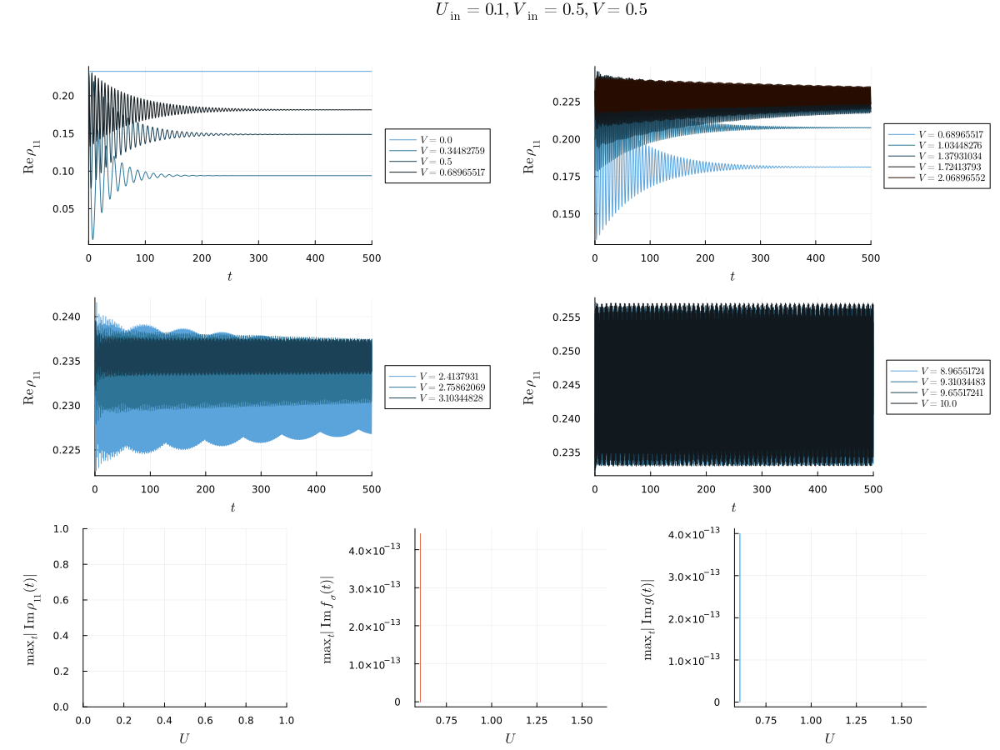

In [9]:
XList = sort(unique(df_pl.V))
XLabel = "V"
YLabel = "rho11"
pa = plot(title=L"U_\mathrm{in}=%$Uin,V_\mathrm{in}=%$Vin,V=0.5", grid=false,showaxis=false,bottom_margn=-0mm)
p0 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, \rho_{11}",xlims=(0,500))
p1 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, \rho_{11}",xlims=(0,500))
p2 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, \rho_{11}",xlims=(0,500))
p3 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, \rho_{11}",xlims=(0,500))
p4 = plot(legend=nothing, xlabel=L"U", ylabel=L"\max_t | \mathrm{Im}\,\rho_{11} (t)|")
p5 = plot(legend=nothing, xlabel=L"U", ylabel=L"\max_t | \mathrm{Im}\,f_\sigma (t)|") 
p6 = plot(legend=nothing, xlabel=L"U", ylabel=L"\max_t | \mathrm{Im}\,g(t)|")
for Xi in XList[1:1:4]
    plot!(p0, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end

for Xi in XList[4:8]
    plot!(p1, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end
for Xi in XList[9:11]
    plot!(p2, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end
for Xi in XList[end-3:end]
    plot!(p3, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end

plot!(p5, df_pl.U, map(x -> maximum(abs.(imag(x))), df_pl[:,:rho11]))
plot!(p5, df_pl.U, map(x -> maximum(abs.(imag(x))), df_pl[:,:f_up]))
plot!(p6, df_pl.U, map(x -> maximum(abs.(imag(x))), df_pl[:,:C01]))

l = @layout [
    tt{1.0w, 0.001h}
    a{0.5w} b{0.5w} 
    c{0.5w} d{0.5w} 
    e{0.3w} f{0.3w}  g{0.3w}
    ]
plot(pa, p0, p1, p2, p3, p4, p5, p6, layout=l, size=(1200,900), left_margin=10mm)

In [10]:
XList = sort(unique(df_Uin.V))
XLabel = "V"
YLabel = "C01"
pa = plot(title=L"U_\mathrm{in}=%$Uin,V_\mathrm{in}=%$Vin,V=0.5", grid=false,showaxis=false,bottom_margn=-0mm)
p0 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, g_{\sigma}",xlims=(0,500))
p1 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, g_{\sigma}",xlims=(0,500))
p2 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, g_{\sigma}",xlims=(0,500))
p3 = plot(legend=:outerright,palette=:berlin10, xlabel=L"t", ylabel=L"\mathrm{Re}\, g_{\sigma}",xlims=(0,500))
p4 = plot(legend=nothing, xlabel=L"U", ylabel=L"\max_t | \mathrm{Im}\,\rho_{11} (t)|")
p5 = plot(legend=nothing, xlabel=L"U", ylabel=L"\max_t | \mathrm{Im}\,f_\sigma (t)|") 
p6 = plot(legend=nothing, xlabel=L"U", ylabel=L"\max_t | \mathrm{Im}\,g(t)|")
for Xi in XList[1:1:4]
    plot!(p0, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end

for Xi in XList[4:5]
    plot!(p1, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end
for Xi in XList[6]
    plot!(p2, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end
for Xi in XList[11]
    plot!(p3, df_pl[df_pl[:,XLabel] .≈ Xi,:t], real.(df_pl[df_pl[:,XLabel] .≈ Xi,YLabel]), label=L"%$XLabel=%$(round(Xi,digits=8))")
end

plot!(p5, df_pl.U, map(x -> maximum(abs.(imag(x))), df_pl[:,:rho11]))
plot!(p5, df_pl.U, map(x -> maximum(abs.(imag(x))), df_pl[:,:f_up]))
plot!(p6, df_pl.U, map(x -> maximum(abs.(imag(x))), df_pl[:,:C01]))

l = @layout [
    tt{1.0w, 0.001h}
    a{0.5w} b{0.5w} 
    c{0.5w} d{0.5w} 
    e{0.3w} f{0.3w}  g{0.3w}
    ]
plot(pa, p0, p1, p2, p3, p4, p5, p6, layout=l, size=(1200,900), left_margin=10mm)

LoadError: UndefVarError: `df_Uin` not defined

In [11]:
XList = sort(unique(df_pl.V))
V_c_i = argmin(real(df_pl.rho11_lim))
V_c = XList[V_c_i]
U_in_i = findfirst(x->x≈Uin,Ux)
display(L"U_\mathrm{C} = %$(V_c)")

#p0 = plot(legend=:outerright,palette=:berlin10, title=L"U_\mathrm{in}=0.1,V_\mathrm{in}=0.5,V=0.5", xlabel=L"t", ylabel=L"\Re \rho_{11}",xlims=(50,500))
#p1 = plot(legend=:outerright,palette=:berlin10, title=L"U_\mathrm{in}=0.1,V_\mathrm{in}=0.5,V=0.5", xlabel=L"t", ylabel=L"\Re \rho_{11}",xlims=(50,500))

                    
p2 = plot(XList, real(df_pl.rho11_lim), xlabel=L"V", ylabel=L"\lim_{t \to \infty} \langle \mathrm{Re}\, f(t) \rangle_{\phi}",legend=:topright, markershape=:auto, label=L"f \equiv \rho_{11}", markersize=2)
plot!(XList, real(df_pl.rho22_lim), label=L"f \equiv \rho_{22}",  markershape=:auto, markersize=2)
plot!(XList, real(df_pl.f_up_lim), label=L"f \equiv f_{\sigma}",  markershape=:auto, markersize=2)
plot!(XList, real(df_pl.C01_lim), label=L"f \equiv g_{\sigma}",  markershape=:auto, markersize=2)
p3 = plot(XList, real(df_pl.rho13_lim), xlabel=L"U", ylabel=L"\lim_{t \to \infty}  \langle \mathrm{Re}\,f(t)\rangle_{\phi}",legend=:topright, markershape=:auto, label=L"f \equiv \rho_{13}")
plot!(XList, real(df_pl.rho24_lim), label=L"f \equiv \rho_{24}",  markershape=:auto)
plot!(XList, real(df_pl.rho12_lim), label=L"f \equiv \rho_{12}",  markershape=:auto)
plot!(XList, real(df_pl.rho34_lim), label=L"f \equiv \rho_{34}",  markershape=:auto)
p4 = plot(XList, imag(df_pl.rho13_lim), xlabel=L"U", ylabel=L"\lim_{t \to \infty} \langle \mathrm{Im}\, f(t)\rangle_{\phi}",legend=:topleft, markershape=:auto, label=L"f \equiv \rho_{13}", markersize=8)
#plot!(Ux, imag(df_pl.rho24_lim), label=L"f \equiv \rho_{24}",  markershape=:auto, markersize=7)
#plot!(Ux, imag(df_pl.rho12_lim), label=L"f \equiv \rho_{12}",  markershape=:auto)
plot!(XList, imag(df_pl.rho34_lim), label=L"f \equiv \rho_{34}",  markershape=:auto)

p5 = plot(XList, imag(df_pl.rho13_lim), xlabel=L"V", ylabel=L"\lim_{t \to \infty} \langle \mathrm{Im}\, f(t)\rangle_{\phi}",legend=:topleft, markershape=:auto, label=L"f \equiv \rho_{13}", markersize=8, xlims=(0.0,0.11), ylims=(-1e-4,1e-4))
#plot!(Ux, imag(df_pl.rho24_lim), label=L"f \equiv \rho_{24}",  markershape=:auto, markersize=7)
#plot!(Ux, imag(df_pl.rho12_lim), label=L"f \equiv \rho_{12}",  markershape=:auto)
plot!(XList, imag(df_pl.rho34_lim), label=L"f \equiv \rho_{34}",  markershape=:auto)
plot!(XList, imag(df_pl.rho11_lim), label=L"f \equiv \rho_{11}", markershape=:auto)
plot!(XList, imag(df_pl.rho22_lim), label=L"f \equiv \rho_{22}",  markershape=:auto)
plot!(XList, imag(df_pl.f_up_lim), label=L"f \equiv f_{\sigma}",  markershape=:auto)
plot!(XList, imag(df_pl.C01_lim), label=L"f \equiv g_{\sigma}",  markershape=:auto)

p6 = plot(XList, imag(df_pl.rho13_lim), xlabel=L"V", ylabel=L"\lim_{t \to \infty} \langle \mathrm{Im}\, f(t)\rangle_{\phi}",legend=:topleft, markershape=:auto, label=L"f \equiv \rho_{13}", markersize=8, xlims=(U_c - U_c/20, U_c + U_c/5))
plot!(XList, imag(df_pl.rho24_lim), label=L"f \equiv \rho_{24}",  markershape=:auto, markersize=7)
plot!(XList, imag(df_pl.rho12_lim), label=L"f \equiv \rho_{12}",  markershape=:auto)
plot!(XList, imag(df_pl.rho34_lim), label=L"f \equiv \rho_{34}",  markershape=:auto)

p7 = plot(XList, imag(df_pl.rho13_lim), xlabel=L"V", ylabel=L"\lim_{t \to \infty} \langle \mathrm{Im}\, f(t)\rangle_{\phi}",legend=:right, markershape=:auto, label=L"f \equiv \rho_{13}", markersize=8, ylims=(-1e-3,1e-3))
#plot!(Ux, imag(df_pl.rho24_lim), label=L"f \equiv \rho_{24}",  markershape=:auto, markersize=7)
#plot!(Ux, imag(df_pl.rho12_lim), label=L"f \equiv \rho_{12}",  markershape=:auto)
plot!(XList, imag(df_pl.rho34_lim), label=L"f \equiv \rho_{34}",  markershape=:auto)
plot!(XList, imag(df_pl.rho11_lim), label=L"f \equiv \rho_{11}", markershape=:auto)
#plot!(Ux, imag(df_pl.rho22_lim), label=L"f \equiv \rho_{22}",  markershape=:auto)
plot!(XList, imag(df_pl.f_up_lim), label=L"f \equiv f_{\sigma}",  markershape=:auto)
plot!(XList, imag(df_pl.C01_lim), label=L"f \equiv g_{\sigma}",  markershape=:auto)

p8 = plot(XList[2:end], df_pl.rho11_ampl_asym[2:end], xlabel=L"V", xlims=(0,2.0), markershape=:auto, ylabel=L"\lim_{t \to \infty} \mathrm{Amplitude}\, [\mathrm{Re}\, f(t)]",
        label=L"f \equiv \rho_{11}")
plot!(XList[2:end], df_pl.f_up_ampl_asym[2:end], markershape=:auto, label=L"f \equiv f_{\sigma}")
plot!(XList[2:end], df_pl.C01_ampl_asym[2:end], markershape=:auto,label= L"f \equiv g_{\sigma}")

p9 = plot(XList, df_pl.rho11_ampl_asym ./ maximum(df_pl.rho11_ampl_asym), xlims=(0,2.0), xlabel=L"V", markershape=:auto, ylabel=L"\lim_{t \to \infty} \mathrm{Rel.Ampl.}\, [\mathrm{Re}\, f(t)]",
        label=L"f \equiv \rho_{11}")
plot!(XList, df_pl.f_up_ampl_asym ./ maximum(df_pl.f_up_ampl_asym), markershape=:auto, label=L"f \equiv f_{\sigma}")
plot!(XList, df_pl.C01_ampl_asym ./ maximum(df_pl.C01_ampl_asym), markershape=:auto,label= L"f \equiv g_{\sigma}")

l = @layout [
        a{0.3w} b{0.3w}  c{0.3w}
        c{0.5w} d{0.5w} 
        e{1.0w}
        f{0.5w} g{0.5w}
    ]
p = plot(p2,p3,p4,p5,p6,p7, p8, p9, size=(1200,900), layout=l, left_margin=10mm, bottom_margin=5mm)
savefig("U_scale.pdf")
display(p)

LoadError: UndefVarError: `Ux` not defined

In [12]:
p2 = plot(Ux, real(df_pl.rho11_lim), xlabel=L"U", ylabel=L"\lim_{t \to \infty} \langle \mathrm{Re}\, f(t) \rangle",legend=:topright, markershape=:auto, label=L"f \equiv \rho_{11}", markersize=2, xlims=(3.5,4.0), ylims=(-0.1,0.1))
plot!(Ux, real(df_pl.rho22_lim), label=L"f \equiv \rho_{22}",  markershape=:auto, markersize=2)
plot!(Ux, real(df_pl.f_up_lim), label=L"f \equiv f_{\sigma}",  markershape=:auto, markersize=2)
plot!(Ux, real(df_pl.C01_lim), label=L"f \equiv g_{\sigma}",  markershape=:auto, markersize=2)

LoadError: UndefVarError: `Ux` not defined

## Fourier Analysis

Extract:
- Frequencies omega_i, number of frequencies
- Amplitude A(t) (power spectrum?)
- phase phi_i

In [26]:
using FourierAnalysis
Upt = 2.6
Up, ii= findmin(abs.(df_Vin.U .- Upt))
freq_cut = 1.5

r11_i = (df_Vin[ii,:rho11])
rho11_lim = (df_Vin[ii,:rho11_lim])
r12_i = (df_Vin[ii,:rho12])
rho12_lim = (df_Vin[ii,:rho12_lim])
fs_i = (df_Vin[ii,:f_up])
f_lim = (df_Vin[ii,:f_up_lim])
gs_i = (df_Vin[ii,:C01])
g_lim = (df_Vin[ii,:C01_lim])
tx = df_Vin[ii,:t]
U_i = df_Vin[ii, :U]

slice = 1:length(r11_i)
tx_fft = tx[slice]
r11_fft = FourierAnalysis.fft(r11_i[slice] .- rho11_lim)[1:end] ./ length(slice)  |> FourierAnalysis.fftshift
r12_fft = FourierAnalysis.fft(r12_i[slice] .- rho12_lim)[1:end] ./ length(slice)  |> FourierAnalysis.fftshift
r11_fft_full = FourierAnalysis.fft(r11_i[slice])[1:end] ./ length(slice)  |> FourierAnalysis.fftshift
freqs = FourierAnalysis.fftfreq(length(tx_fft), 1.0/diff(tx_fft)[1]) |> FourierAnalysis.fftshift


fs_fft = FourierAnalysis.fft(fs_i[slice] .- f_lim)[1:end] ./ length(slice)  |> FourierAnalysis.fftshift
gs_fft = FourierAnalysis.fft(gs_i[slice] .- g_lim)[1:end] ./ length(slice)  |> FourierAnalysis.fftshift


freqs = FourierAnalysis.fftfreq(length(tx_fft), 1.0/diff(tx_fft)[1]) |> FourierAnalysis.fftshift
spectrums_rho11_zm = log.(abs.(hcat(df_Vin.rho11_fft_zm...)))
spectrums_rho12_zm = log.(abs.(hcat(df_Vin.rho12_fft_zm...)))
spectrums_f_zm = log.(abs.(hcat(df_Vin.f_up_fft_zm...)))
spectrums_g_zm = log.(abs.(hcat(df_Vin.C01_fft_zm...)))
spectrums_rho11 = log.(abs.(hcat(df_Vin.rho11_fft...)))
spectrums_rho12 = log.(abs.(hcat(df_Vin.rho12_fft...)))
spectrums_f = log.(abs.(hcat(df_Vin.f_up_fft...)))
spectrums_g = log.(abs.(hcat(df_Vin.C01_fft...)));

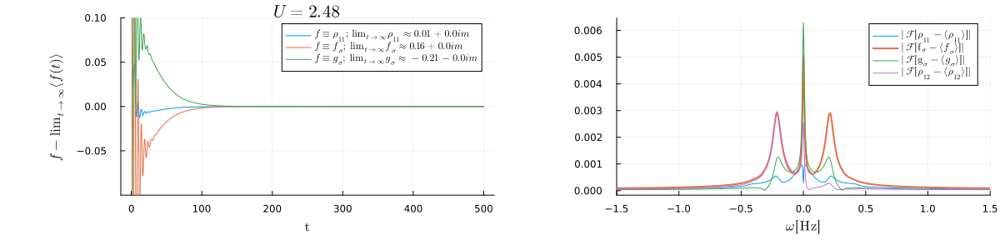

In [9]:
p1 = plot(tx, real(r11_i .- rho11_lim), ylims=(-0.1,0.1),
        title=L"U=%$(round(U_i,digits=2))", xlabel=L"\mathrm{t}", ylabel=L"f - \lim_{t \to \infty} \langle f(t) \rangle", label=L"f \equiv \rho_{11};\, \lim_{t\to\infty} \rho_{11}  \approx %$(round(rho11_lim,digits=2))")
#vline!([tx[first(slice)]], color=:orange, label="FT start")
plot!(tx, real(fs_i .- f_lim), label=L"f \equiv f_\sigma;\; \lim_{t\to\infty} f_\sigma \approx %$(round(f_lim,digits=2))")
plot!(tx, real(gs_i .- g_lim), label=L"f \equiv g_\sigma;\; \lim_{t\to\infty} g_\sigma \approx %$(round(g_lim,digits=2))")
p2 = plot(freqs, abs.(r11_fft), xlabel=L"\omega [\mathrm{Hz}]", label=L" | \mathcal{F}[\mathrm{\rho_{11}} - \langle \rho_{11} \rangle] |", xlims=(-freq_cut,freq_cut))
plot!(freqs, abs.(fs_fft), label=L"| \mathcal{F}[\mathrm{f_\sigma} - \langle f_\sigma \rangle] |", xlims=(-freq_cut,freq_cut), lw=2)
plot!(freqs, abs.(gs_fft), label=L"| \mathcal{F}[\mathrm{g_\sigma}  - \langle g_\sigma \rangle] |", xlims=(-freq_cut,freq_cut))
plot!(freqs, abs.(r12_fft), label=L"|\mathcal{F}[\mathrm{\rho_{12}} - \langle \rho_{12} \rangle]  |", xlims=(-freq_cut,freq_cut))

l = @layout [
    a{0.5w} b{0.5w}
    ]
p = plot(p1, p2,  layout=l,size=(1200,300), left_margin=20mm, bottom_margin=10mm)
display(p)

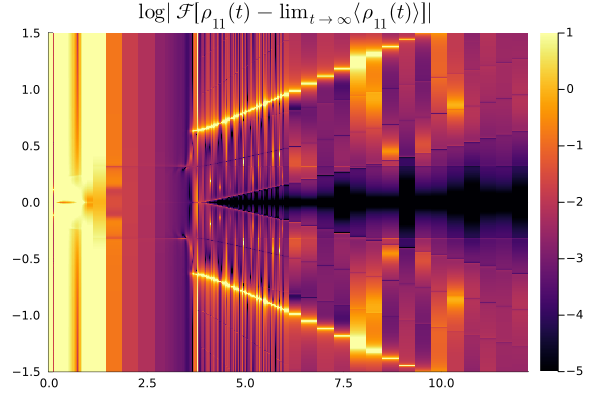

In [54]:

    p7 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho11 .- spectrums_g,clims=(-5,1), ylims=(-freq_cut,freq_cut),       title=L"\log \,|\mathcal{F}[\rho_{11}(t) - \lim_{t \to \infty} \langle \rho_{11}(t) \rangle]|")

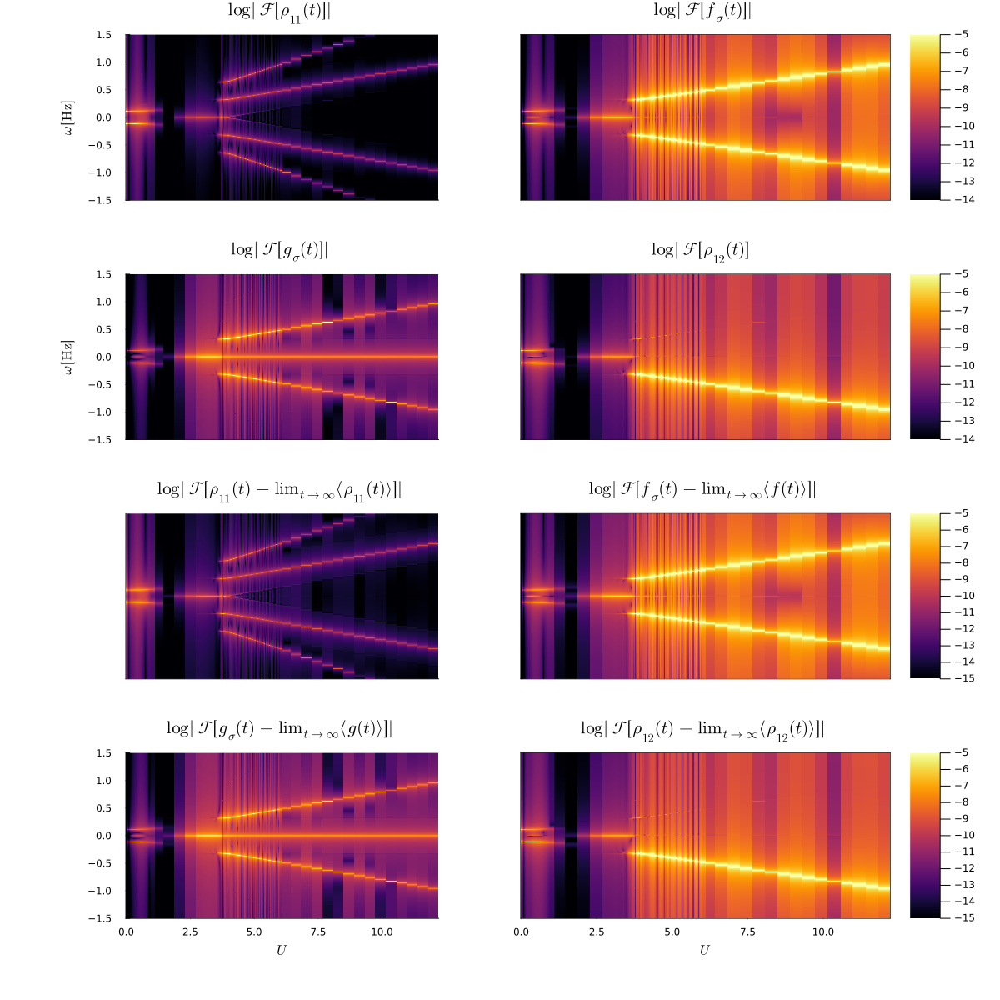

In [10]:
p3 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho11_zm,clims=(-14,-5), ylims=(-freq_cut,freq_cut), ylabel=L"\omega [\mathrm{Hz}]", title=L"\log \,|\mathcal{F}[\rho_{11}(t)]|",legend=nothing, xticks=nothing, bottom_margin=-5mm, right_margin=-5mm)
p4 = heatmap(Ux,df_Vin[1,:freqs],spectrums_f_zm,clims=(-14,-5), ylims=(-freq_cut,freq_cut),  title=L"\log \,|\mathcal{F}[f_\sigma(t)]|", framestyle=:box, xticks=nothing, yticks=nothing)
p5 = heatmap(Ux,df_Vin[1,:freqs],spectrums_g_zm,clims=(-14,-5), ylims=(-freq_cut,freq_cut), ylabel=L"\omega [\mathrm{Hz}]", title=L"\log \,|\mathcal{F}[g_\sigma(t)]|",legend=nothing, xticks=nothing)
p6 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho12_zm,clims=(-14,-5), ylims=(-freq_cut,freq_cut),   title=L"\log \,|\mathcal{F}[\rho_{12}(t)]|", framestyle=:box, xticks=nothing, yticks=nothing)
p7 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho11,clims=(-15,-5), ylims=(-freq_cut,freq_cut),       title=L"\log \,|\mathcal{F}[\rho_{11}(t) - \lim_{t \to \infty} \langle \rho_{11}(t) \rangle]|",legend=nothing, xticks=nothing, yticks=nothing)
p8 = heatmap(Ux,df_Vin[1,:freqs],spectrums_f,clims=(-15,-5), ylims=(-freq_cut,freq_cut),         title=L"\log \,|\mathcal{F}[f_\sigma(t) - \lim_{t \to \infty} \langle f(t) \rangle]|", framestyle=:box, xticks=nothing, yticks=nothing)
p9 = heatmap(Ux,df_Vin[1,:freqs],spectrums_g,clims=(-15,-5), ylims=(-freq_cut,freq_cut), xlabel=L"U",  title=L"\log \,|\mathcal{F}[g_\sigma(t) - \lim_{t \to \infty} \langle g(t) \rangle]|",legend=nothing)
p10 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho12,clims=(-15,-5), ylims=(-freq_cut,freq_cut), xlabel=L"U",  title=L"\log \,|\mathcal{F}[\rho_{12}(t) - \lim_{t \to \infty} \langle \rho_{12}(t) \rangle]|", framestyle=:box, yticks=nothing)

l = @layout [
    c{0.4w} d{0.6w} 
    e{0.4w} f{0.6w} 
    g{0.4w} h{0.6w}
    l{0.4w} j{0.6w}
    ]
p = plot( p3, p4, p5, p6, p7, p8, p9, p10, layout=l,size=(1200,1200), left_margin=20mm, bottom_margin=10mm)
savefig("fourier.pdf")
display(p)

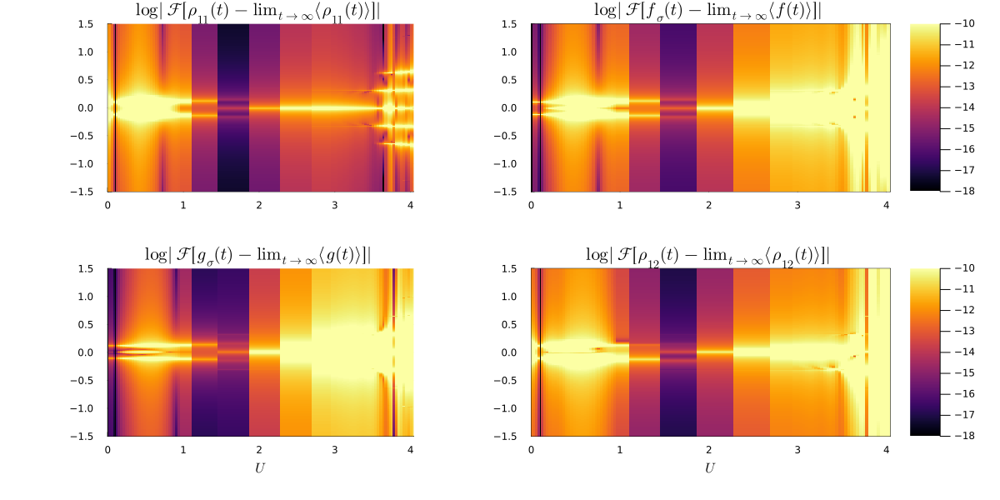

In [50]:
p7 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho11,clims=(-18,-10), ylims=(-freq_cut,freq_cut), xlims=(0,1.1*U_c), title=L"\log \,|\mathcal{F}[\rho_{11}(t) - \lim_{t \to \infty} \langle \rho_{11}(t) \rangle]|",legend=nothing,)
p8 = heatmap(Ux,df_Vin[1,:freqs],spectrums_f,clims=(-18,-10), ylims=(-freq_cut,freq_cut), xlims=(0,1.1*U_c),         title=L"\log \,|\mathcal{F}[f_\sigma(t) - \lim_{t \to \infty} \langle f(t) \rangle]|", framestyle=:box,)
p9 = heatmap(Ux,df_Vin[1,:freqs],spectrums_g,clims=(-18,-10), ylims=(-freq_cut,freq_cut), xlims=(0,1.1*U_c), xlabel=L"U",  title=L"\log \,|\mathcal{F}[g_\sigma(t) - \lim_{t \to \infty} \langle g(t) \rangle]|",legend=nothing)
p10 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho12,clims=(-18,-10), ylims=(-freq_cut,freq_cut), xlims=(0,1.1*U_c), xlabel=L"U",  title=L"\log \,|\mathcal{F}[\rho_{12}(t) - \lim_{t \to \infty} \langle \rho_{12}(t) \rangle]|", framestyle=:box)

l = @layout [ 
    g{0.4w} h{0.6w}
    l{0.4w} j{0.6w}
    ]
p = plot(p7, p8, p9, p10, layout=l,size=(1200,600), left_margin=20mm, bottom_margin=10mm)
display(p)

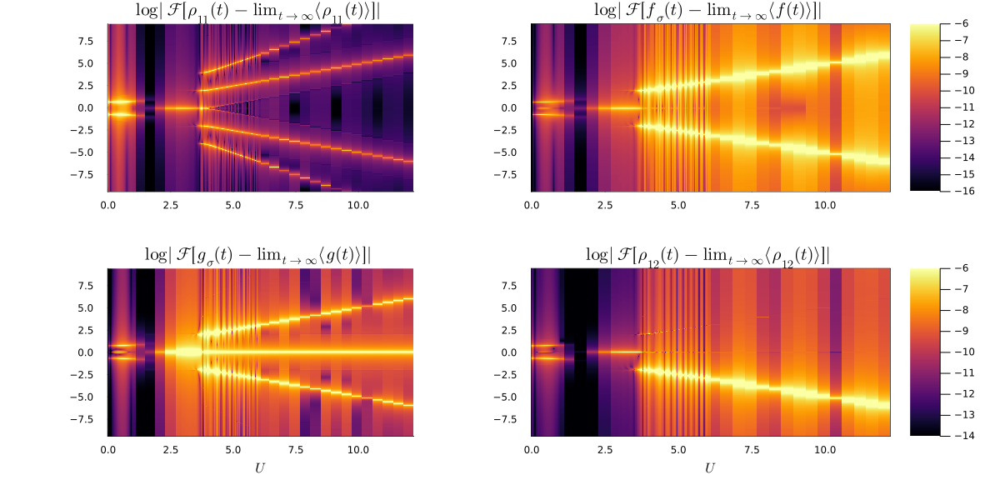

In [12]:
p7 = heatmap(Ux,2π .* df_Vin[1,:freqs],spectrums_rho11,clims=(-16,-8), ylims=2π .*(-freq_cut,freq_cut),       title=L"\log \,|\mathcal{F}[\rho_{11}(t) - \lim_{t \to \infty} \langle \rho_{11}(t) \rangle]|",legend=nothing,)
p8 = heatmap(Ux,2π .* df_Vin[1,:freqs],spectrums_f,clims=(-16,-6), ylims=2π .*(-freq_cut,freq_cut),         title=L"\log \,|\mathcal{F}[f_\sigma(t) - \lim_{t \to \infty} \langle f(t) \rangle]|", framestyle=:box,)
p9 = heatmap(Ux,2π .* df_Vin[1,:freqs],spectrums_g,clims=(-16,-8), ylims=2π .*(-freq_cut,freq_cut), xlabel=L"U",  title=L"\log \,|\mathcal{F}[g_\sigma(t) - \lim_{t \to \infty} \langle g(t) \rangle]|",legend=nothing)
p10 = heatmap(Ux,2π .* df_Vin[1,:freqs],spectrums_rho12,clims=(-14,-6), ylims=2π .*(-freq_cut,freq_cut), xlabel=L"U",  title=L"\log \,|\mathcal{F}[\rho_{12}(t) - \lim_{t \to \infty} \langle \rho_{12}(t) \rangle]|", framestyle=:box)

l = @layout [ 
    g{0.4w} h{0.6w}
    l{0.4w} j{0.6w}
    ]
p = plot(p7, p8, p9, p10, layout=l,size=(1200,600), left_margin=20mm, bottom_margin=10mm)
display(p)

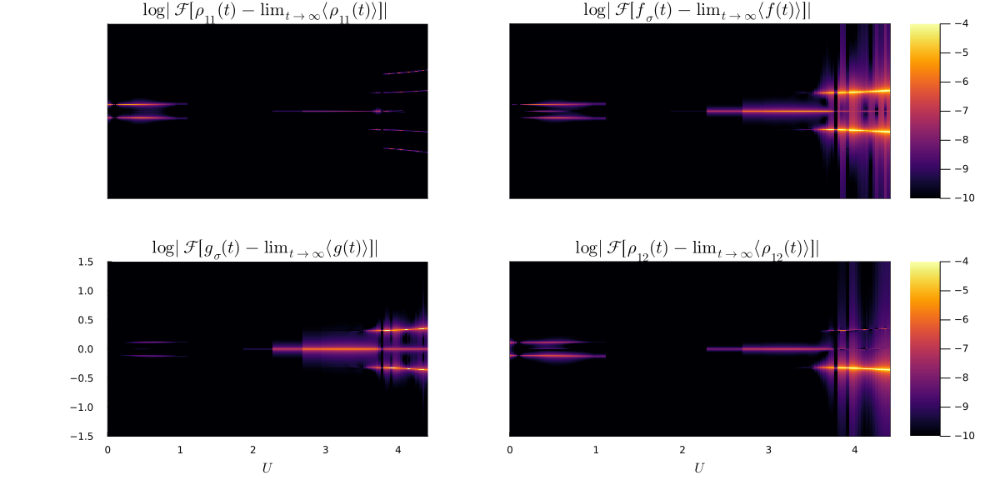

In [13]:
p7 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho11,clims=(-10,-4), ylims=(-freq_cut,freq_cut), xlims=(0,1.2 * U_c),       title=L"\log \,|\mathcal{F}[\rho_{11}(t) - \lim_{t \to \infty} \langle \rho_{11}(t) \rangle]|",legend=nothing, xticks=nothing, yticks=nothing)
p8 = heatmap(Ux,df_Vin[1,:freqs],spectrums_f,clims=(-10,-4), ylims=(-freq_cut,freq_cut), xlims=(0,1.2 * U_c),         title=L"\log \,|\mathcal{F}[f_\sigma(t) - \lim_{t \to \infty} \langle f(t) \rangle]|", framestyle=:box, xticks=nothing, yticks=nothing)
p9 = heatmap(Ux,df_Vin[1,:freqs],spectrums_g,clims=(-10,-4), ylims=(-freq_cut,freq_cut), xlims=(0,1.2 * U_c), xlabel=L"U",  title=L"\log \,|\mathcal{F}[g_\sigma(t) - \lim_{t \to \infty} \langle g(t) \rangle]|",legend=nothing)
p10 = heatmap(Ux,df_Vin[1,:freqs],spectrums_rho12,clims=(-10,-4), ylims=(-freq_cut,freq_cut), xlims=(0,1.2 * U_c), xlabel=L"U",  title=L"\log \,|\mathcal{F}[\rho_{12}(t) - \lim_{t \to \infty} \langle \rho_{12}(t) \rangle]|", framestyle=:box, yticks=nothing)

l = @layout [
    g{0.4w} h{0.6w}
    l{0.4w} j{0.6w}
    ]
p = plot(  p7, p8, p9, p10, layout=l,size=(1200,600), left_margin=20mm, bottom_margin=10mm)
#savefig("fourier2.pdf")
display(p)

In [15]:
Uin

0.1

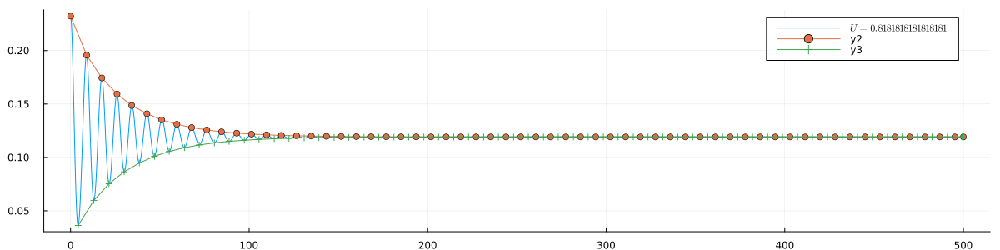

In [206]:
#y=analyticsignal(r11_0)
using Images
Ui = 30

r11_0 = real(df_Vin[df_Vin.U .≈ Ux[Ui], :rho11][1])
maxy_ix = findlocalmaxima(r11_0)[1:end]
miny_ix = findlocalminima(r11_0)
plot(tx, r11_0, label=L"U=%$(Ux[Ui])", size=(1200,300))
plot!(tx[maxy_ix],r11_0[maxy_ix],markershape=:auto)
plot!(tx[miny_ix],r11_0[miny_ix],markershape=:auto)


[1.3048369496004852e-8, 9.713821122470101e-9, 7.230643320199626e-9]
[1.3048369496004852e-8, 9.713821122470101e-9, 7.230643320199626e-9]


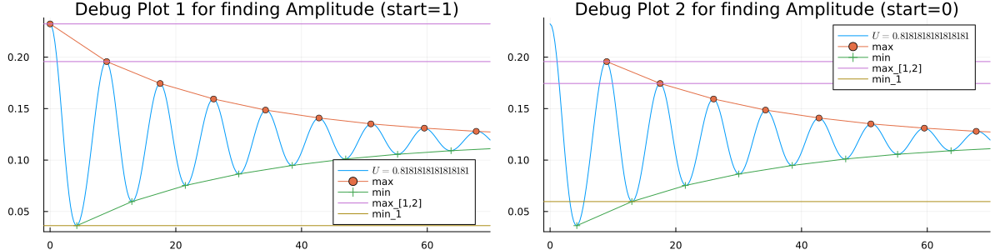

In [258]:
maxy_ix_test = findlocalmaxima(r11_0)[1:end]
miny_ix_test = findlocalminima(r11_0)
start = tx[miny_ix_test[1]] <  tx[maxy_ix_test[1]] ? 0 : 1
ind = 2:length(maxy_ix_test)-2
ampl = Vector{Float64}(undef, length(ind))
t_ampl = tx[miny_ix_test[ind]]
ii_test = 0
for (i,ii) in enumerate(ind)
    i == 1 && (ii_test = ii)
    ampl[i] = mean(r11_0[maxy_ix_test[ii-1:ii]]) - r11_0[miny_ix_test[ii-start]]
end
println(ampl[end-2:end])
ii = ii_test
p1 = plot(tx, r11_0, label=L"U=%$(Ux[Ui])", size=(1200,300), xlims=(-1,70), title="Debug Plot 1 for finding Amplitude (start=$start)")
plot!(tx[maxy_ix_test],r11_0[maxy_ix_test],markershape=:auto, label="max")
plot!(tx[miny_ix_test],r11_0[miny_ix_test],markershape=:auto, label="min")
hline!(r11_0[maxy_ix_test[ii-1:ii]], label="max_[1,2]")
hline!([r11_0[miny_ix_test[ii-start]]],label="min_1")

maxy_ix_test = findlocalmaxima(r11_0)[2:end]
miny_ix_test = findlocalminima(r11_0)
start = tx[miny_ix_test[1]] <  tx[maxy_ix_test[1]] ? 0 : 1
ind = 2:length(maxy_ix_test)-2
ampl = Vector{Float64}(undef, length(ind))
t_ampl = tx[miny_ix_test[ind]]
ii_test = 0
for (i,ii) in enumerate(ind)
    i == 1 && (ii_test = ii)
    ampl[i] = mean(r11_0[maxy_ix_test[ii-1:ii]]) - r11_0[miny_ix_test[ii]]
end
println(ampl[end-2:end])
ii = ii_test
p2 = plot(tx, r11_0, label=L"U=%$(Ux[Ui])", size=(1200,300), xlims=(-1,70), title="Debug Plot 2 for finding Amplitude (start=$start)")
plot!(tx[maxy_ix_test],r11_0[maxy_ix_test],markershape=:auto, label="max")
plot!(tx[miny_ix_test],r11_0[miny_ix_test],markershape=:auto, label="min")
hline!(r11_0[maxy_ix_test[ii-1:ii]], label="max_[1,2]")
hline!([r11_0[miny_ix_test[ii]]],label="min_1")

plot(p1,p2, size=(1200,300))

In [219]:
p2

# std? of time plot
# lim of amplitude plot (extrapolate!!!!)

# Amplitude (contradiction to paper)

# Effects of V

- V -> oo : higher frequency
- V > V_C : more than one frequency

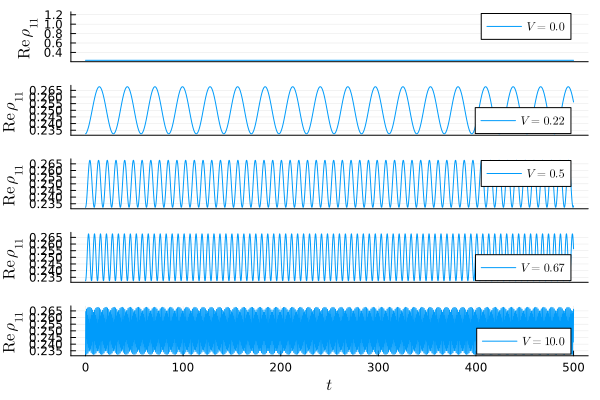

In [24]:
tt = df[df.U .≈ 0.0 .&& df.V .≈ 0.0,:]
p1 = plot(tt.t, real(tt.rho11), xaxis=nothing, ylabel=L"\mathrm{Re}\,\rho_{11}", label=L"V=%$0.0")
tt = df[df.U .≈ 0.0 .&& df.V .≈ VList[2],:]
p2 = plot(tt.t, real(tt.rho11), xaxis=nothing, ylabel=L"\mathrm{Re}\,\rho_{11}", label=L"V=%$(round(VList[2],digits=2))")
tt = df[df.U .≈ 0.0 .&& df.V .≈ 0.5,:]
p3 = plot(tt.t, real(tt.rho11), xaxis=nothing, ylabel=L"\mathrm{Re}\,\rho_{11}", label=L"V=%$(round(0.5,digits=2))")
tt = df[df.U .≈ 0.0 .&& df.V .≈ VList[6],:]
p4 = plot(tt.t, real(tt.rho11), xaxis=nothing, ylabel=L"\mathrm{Re}\,\rho_{11}", label=L"V=%$(round(VList[6],digits=2))")
tt = df[df.U .≈ 0.0 .&& df.V .≈ VList[end],:]
p5 = plot(tt.t, real(tt.rho11), xlabel=L"t", ylabel=L"\mathrm{Re}\,\rho_{11}", label=L"V=%$(round(VList[end],digits=2))")

plot(p1,p2,p3,p4,p5, layout=(5,1))